# Procesamiento Digital de Imágenes - UNS - Doctorado

Trabajo Práctico 1 - Espacios Cromáticos

1. Cargar una imágen y obtener los 3 canales RGB, indicando cómo es la matriz de transformación utilizada en cada caso
2. Intercambiar los canales de una imágen (R-->G, G-->B, B-->R)
3. Convertir una imágen RGB a YIQ
   - a) Modificar los canales YIQ
   - b) Volver a convertir la imágen a RGB y compararla con la original

In [1]:
# load and display an image with Matplotlib
import os
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt


from matplotlib.widgets import Slider

1. Cargar una imágen y obtener los 3 canales RGB, indicando cómo es la matriz de transformación utilizada en cada caso.

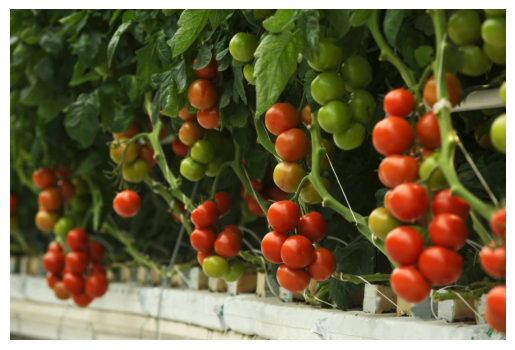

(1000, 1500, 3)


In [2]:
# load image as pixel array
# An image of a file opens
image = mpimg.imread(os.path.join(os.getcwd(), "images", "hydroponic.jpg")) / 255

plt.imshow(image)
plt.axis('off')  # Para desactivar los ejes en la visualización
plt.show()

print(image.shape)  

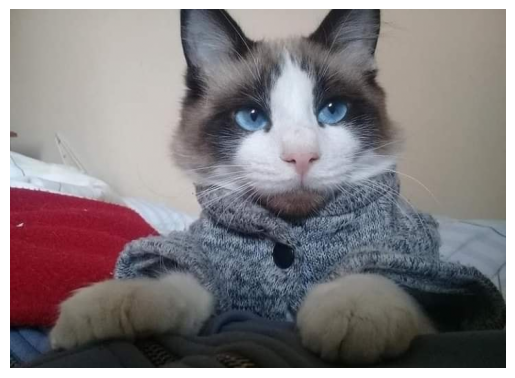

(521, 720, 3)


In [3]:
image2 = mpimg.imread(os.path.join(os.getcwd(), "images", "shely720x521.jpg")) / 255

plt.imshow(image2)
plt.axis('off')  # Para desactivar los ejes en la visualización
plt.show()

print(image2.shape) 

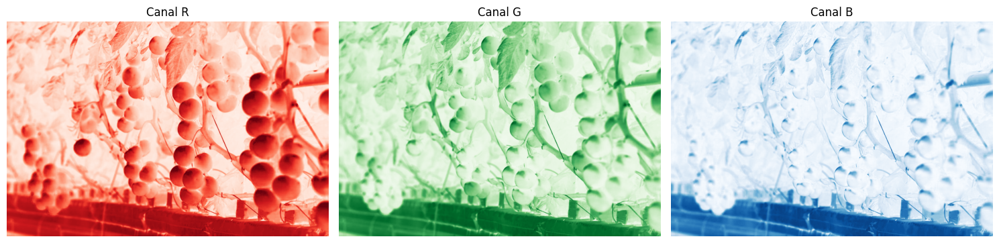

In [4]:
R1 = image[:, :, 0]  # Canal Rojo
G1 = image[:, :, 1]  # Canal Verde
B1 = image[:, :, 2]  # Canal Azul


fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(R1, cmap='Reds')
axs[0].set_title('Canal R')
axs[1].imshow(G1, cmap='Greens')
axs[1].set_title('Canal G')
axs[2].imshow(B1, cmap='Blues')
axs[2].set_title('Canal B')

for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()

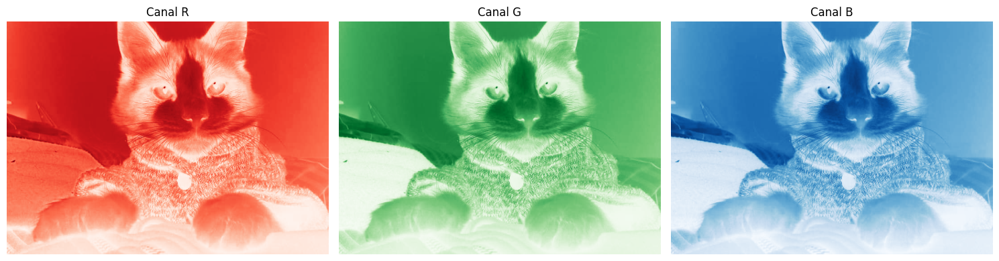

In [5]:
R2 = image2[:, :, 0]  # Canal Rojo
G2 = image2[:, :, 1]  # Canal Verde
B2 = image2[:, :, 2]  # Canal Azul


fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].imshow(R2, cmap='Reds')
axs[0].set_title('Canal R')
axs[1].imshow(G2, cmap='Greens')
axs[1].set_title('Canal G')
axs[2].imshow(B2, cmap='Blues')
axs[2].set_title('Canal B')

for ax in axs:
    ax.axis('off')

plt.tight_layout()
plt.show()

2. Intercambiar los canales de una imágen (R-->G, G-->B, B-->R)

In [6]:
def change_channel(img):

    new_img = np.copy(img)

    height, width, channels = new_img.shape

    for y in range(height):

        for x in range(width):

            r, g, b = new_img[y, x]

            r1 = g

            g1 = b

            b1 = r

            new_img[y, x] = [r1, g1, b1]
            
    return new_img

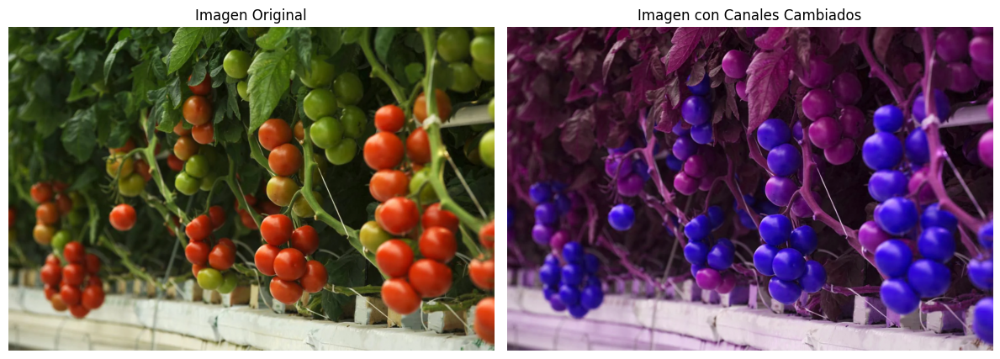

In [7]:
new_image = change_channel(image)

# Mostrar ambas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image)
axes[0].set_title("Imagen Original")
axes[0].axis('off')

axes[1].imshow(new_image)
axes[1].set_title("Imagen con Canales Cambiados")
axes[1].axis('off')

plt.tight_layout()
plt.show()

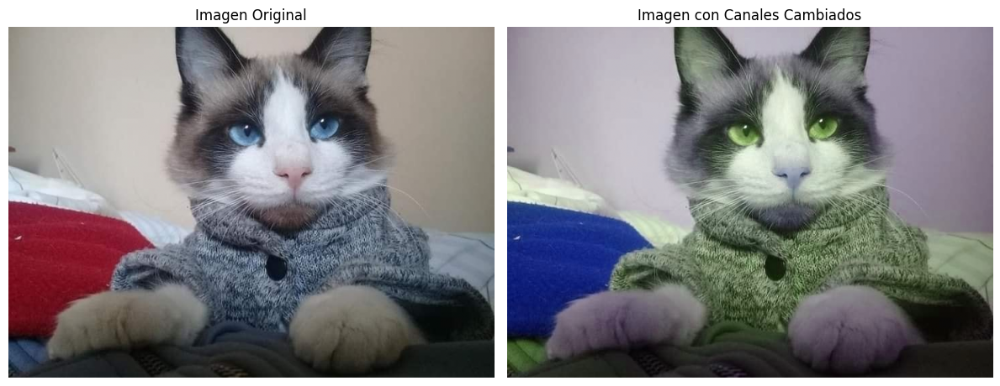

In [8]:
new_image2 = change_channel(image2)

# Mostrar ambas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image2)
axes[0].set_title("Imagen Original")
axes[0].axis('off')

axes[1].imshow(new_image2)
axes[1].set_title("Imagen con Canales Cambiados")
axes[1].axis('off')

plt.tight_layout()
plt.show()

3. Convertir una imágen RGB a YIQ.
   - a) Modificar los canales YIQ.
   - b) Volver a convertir la imágen a RGB, y compararla con la original.

In [9]:
class ImageOperation:

    def __init__(self, img):
        
        self.img = img.astype(np.float32)  # Aseguramos tipo float para cálculos

    def rgbToYIQ(self):
        
        height, width, _ = self.img.shape
        yiq_img = np.zeros_like(self.img)

        for y in range(height):
            for x in range(width):
                r, g, b = self.img[y, x]
                y_val = 0.299 * r + 0.587 * g + 0.114 * b
                i_val = 0.595716 * r - 0.274453 * g - 0.321263 * b
                q_val = 0.211456 * r - 0.522591 * g + 0.311135 * b
                yiq_img[y, x] = [y_val, i_val, q_val]

        return yiq_img

    def yiqToRGB(self, yiq_img):
        height, width, _ = yiq_img.shape
        rgb_img = np.zeros_like(yiq_img)

        for y in range(height):
            for x in range(width):
                y_val, i_val, q_val = yiq_img[y, x]
                r = y_val + 0.9563 * i_val + 0.6210 * q_val
                g = y_val - 0.2721 * i_val - 0.6474 * q_val
                b = y_val - 1.1070 * i_val + 1.7046 * q_val
                rgb_img[y, x] = [r, g, b]

        return np.clip(rgb_img, 0, 1)

    def adjust_luminance_saturation(self, a=1.0, b=1.0):
        yiq_img = self.rgbToYIQ()
        height, width, _ = yiq_img.shape
        new_yiq = np.copy(yiq_img)

        for y in range(height):
            for x in range(width):
                y_val, i_val, q_val = yiq_img[y, x]

                # Aplicar coeficientes
                y_val *= a
                i_val *= b
                q_val *= b

                # Clipping de los valores
                y_val = min(y_val, 1.0)
                i_val = np.clip(i_val, -0.5957, 0.5957)
                q_val = np.clip(q_val, -0.5226, 0.5226)

                new_yiq[y, x] = [y_val, i_val, q_val]

        # Volver a RGB
        return self.yiqToRGB(new_yiq)

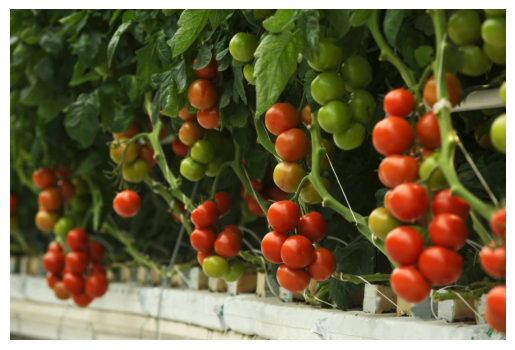

(1000, 1500, 3)


In [10]:
# load image as pixel array
# An image of a file opens
image = mpimg.imread(os.path.join(os.getcwd(), "images", "hydroponic.jpg")) / 255

plt.imshow(image)
plt.axis('off')  # Para desactivar los ejes en la visualización
plt.show()

print(image.shape) 

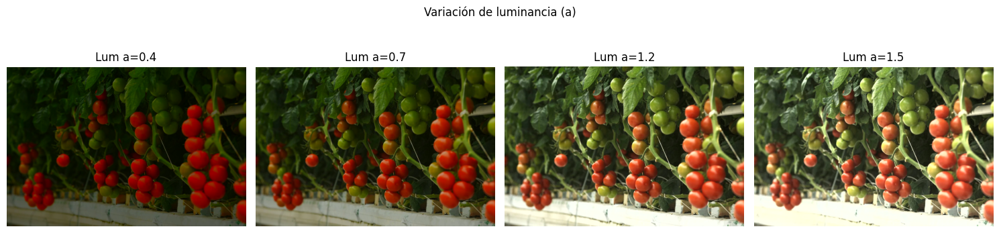

In [11]:
processor = ImageOperation(image)

a_vals = [0.4, 0.7, 1.2, 1.5]
b_vals = [0.0, 0.5, 1.0, 1.5]

fig, axs = plt.subplots(1, len(a_vals), figsize=(15, 4))
for i, a in enumerate(a_vals):
    result = processor.adjust_luminance_saturation(a=a, b=1.0)
    axs[i].imshow(result)
    axs[i].set_title(f"Lum a={a}")
    axs[i].axis('off')
plt.suptitle("Variación de luminancia (a)")
plt.tight_layout()
plt.show()

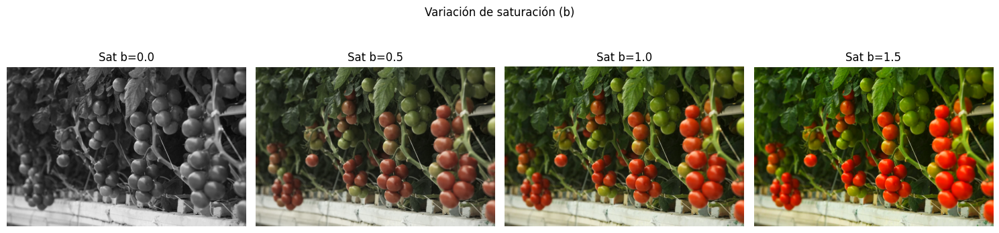

In [12]:
# 2. Variando solo b
fig, axs = plt.subplots(1, len(b_vals), figsize=(15, 4))
for i, b in enumerate(b_vals):
    result = processor.adjust_luminance_saturation(a=1.0, b=b)
    axs[i].imshow(result)
    axs[i].set_title(f"Sat b={b}")
    axs[i].axis('off')
plt.suptitle("Variación de saturación (b)")
plt.tight_layout()
plt.show()

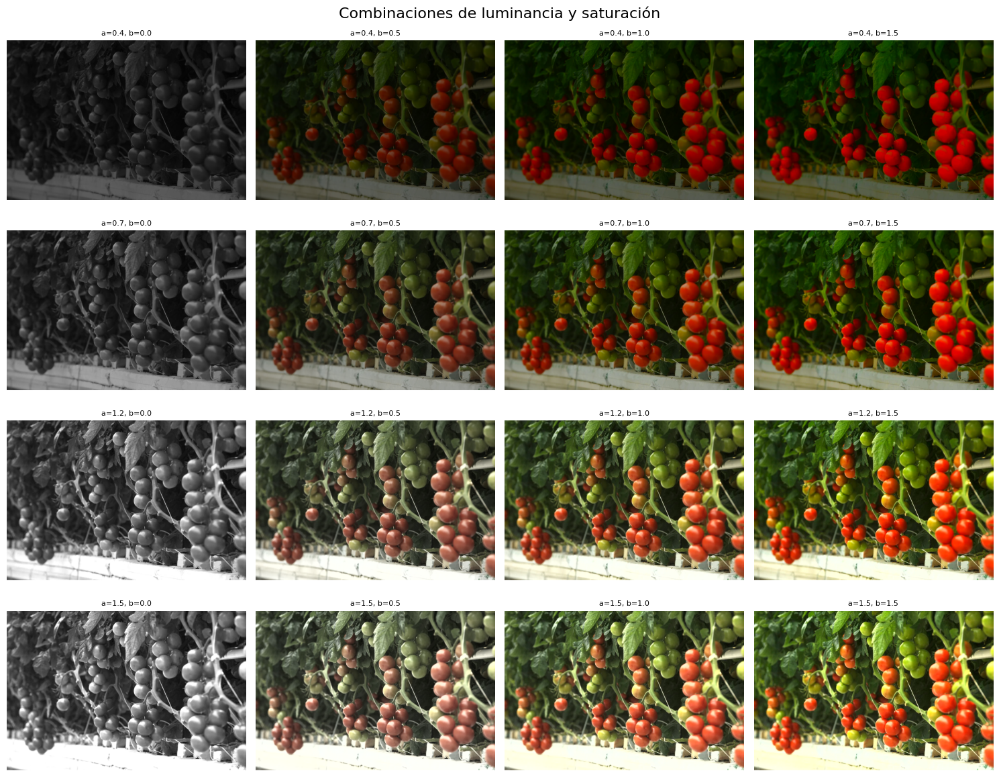

In [13]:
# 3. Combinaciones de a y b
fig, axs = plt.subplots(len(a_vals), len(b_vals), figsize=(15, 12))
for i, a in enumerate(a_vals):
    for j, b in enumerate(b_vals):
        result = processor.adjust_luminance_saturation(a=a, b=b)
        axs[i, j].imshow(result)
        axs[i, j].set_title(f"a={a}, b={b}", fontsize=8)
        axs[i, j].axis('off')
plt.suptitle("Combinaciones de luminancia y saturación", fontsize=16)
plt.tight_layout()
plt.show()

# Mapas cromáticos

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

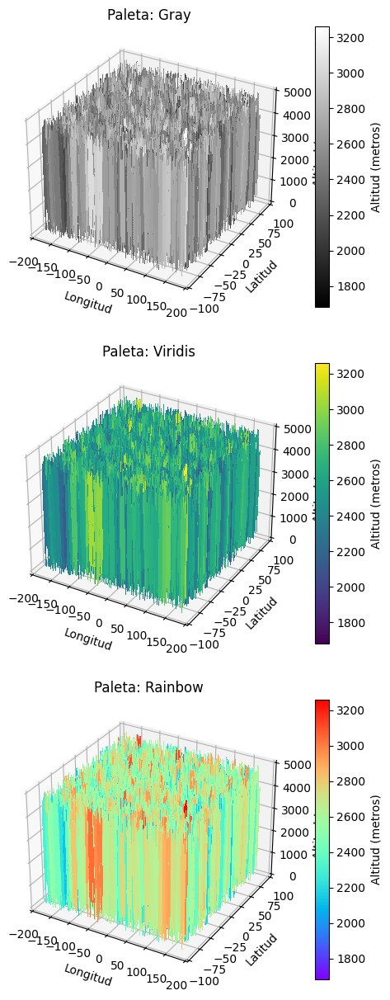

In [15]:
# Generar datos de altitud de ejemplo
latitudes = np.linspace(-90, 90, 360)
longitudes = np.linspace(-180, 180, 720)
elevaciones = np.random.rand(len(latitudes), len(longitudes)) * 5000  # Altitudes en metros

# Crear una malla de latitudes y longitudes
X, Y = np.meshgrid(longitudes, latitudes)

# Crear la figura y los subgráficos en columnas
fig, axes = plt.subplots(3, 1, figsize=(8, 15), subplot_kw={'projection': '3d'})

# Visualizar el mapa de altitud con diferentes paletas
for i, cmap in enumerate(['gray', 'viridis', 'rainbow']):
    ax = axes[i]
    surf = ax.plot_surface(X, Y, elevaciones, cmap=cmap, linewidth=0, antialiased=False)
    ax.set_title(f'Paleta: {cmap.capitalize()}')
    ax.set_xlabel('Longitud')
    ax.set_ylabel('Latitud')
    ax.set_zlabel('Altitud (metros)')

    # Añadir barra de colores
    fig.colorbar(surf, ax=ax, label='Altitud (metros)')

plt.show()

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color


# 1) Imagen de la Luna (grayscale 2D)
moon = data.moon()  # 512x512 aprox, ya es 2D

# 2) Hubble Deep Field (RGB) -> convertimos a luminancia para usar mapas 2D
hdf = data.hubble_deep_field()
hdf_gray = color.rgb2gray(hdf)   # 2D en [0,1]

datasets = [
    ("Luna (grayscale)", moon),
    ("Hubble Deep Field (luminancia)", hdf_gray),
]

cmaps = ["gray", "rainbow", "viridis"]  # pedida: gris y arco iris (rainbow)

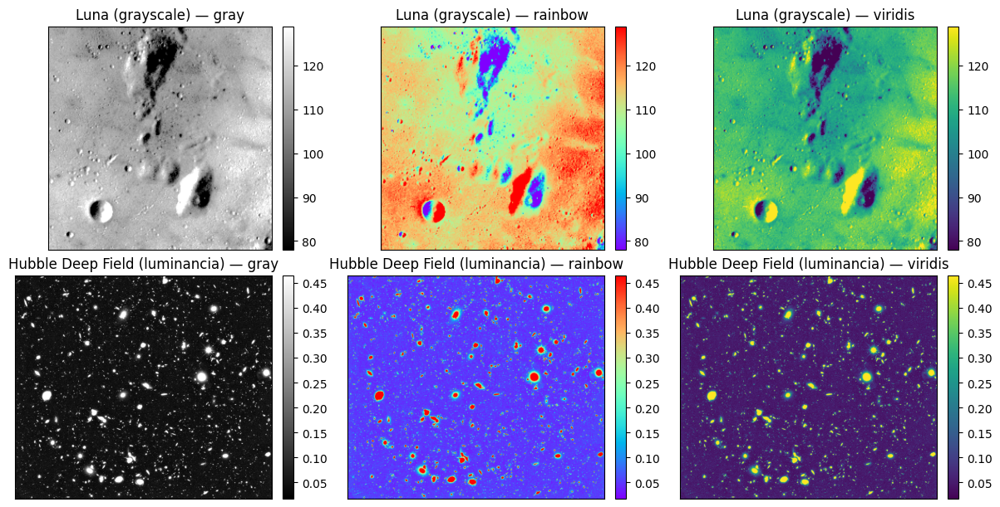

In [17]:
fig, axes = plt.subplots(len(datasets), len(cmaps), figsize=(12, 6), constrained_layout=True)
for i, (title, arr) in enumerate(datasets):
    vmin, vmax = np.percentile(arr, [2, 98])  # mejora el contraste
    for j, cmap in enumerate(cmaps):
        ax = axes[i, j] if len(datasets) > 1 else axes[j]
        im = ax.imshow(arr, cmap=cmap, origin="lower", vmin=vmin, vmax=vmax)
        ax.set_title(f"{title} — {cmap}")
        ax.set_xticks([]); ax.set_yticks([])
        fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.show()